In [946]:
import cv2 as cv
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

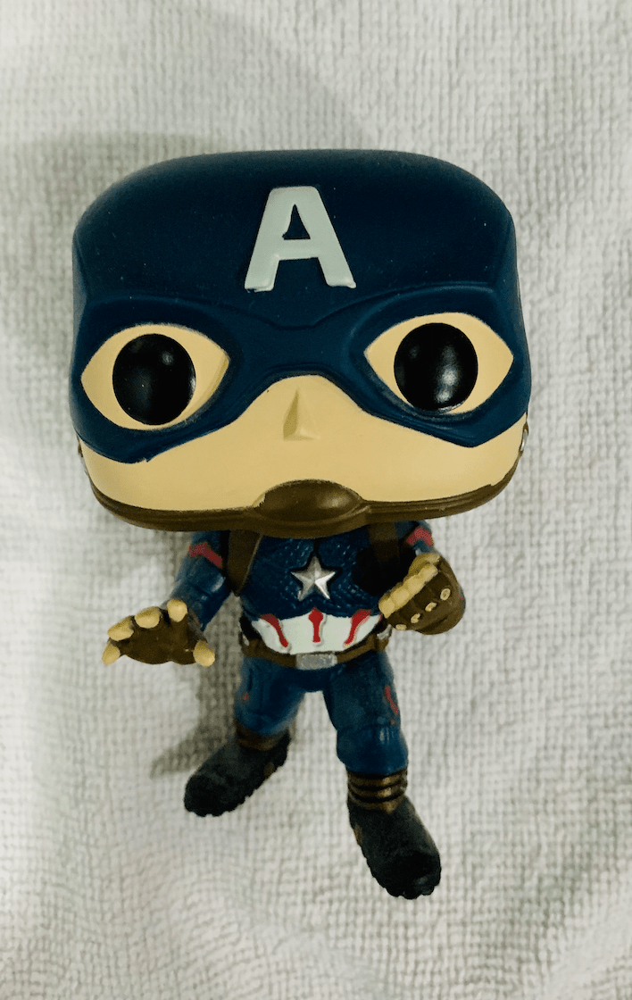

In [947]:
image1 = cv.imread('/content/drive/My Drive/BCML/foto/foto2/1-min.png')
image2 = cv.imread('/content/drive/My Drive/BCML/foto/foto2/2-min.png')
image3 = cv.imread('/content/drive/My Drive/BCML/foto/foto2/3-min.png')
image4 = cv.imread('/content/drive/My Drive/BCML/foto/foto2/4-min.png')
image5 = cv.imread('/content/drive/My Drive/BCML/foto/foto2/5-min.png')
image6 = cv.imread('/content/drive/My Drive/BCML/foto/foto2/6-min.png')

cv2_imshow(image4)

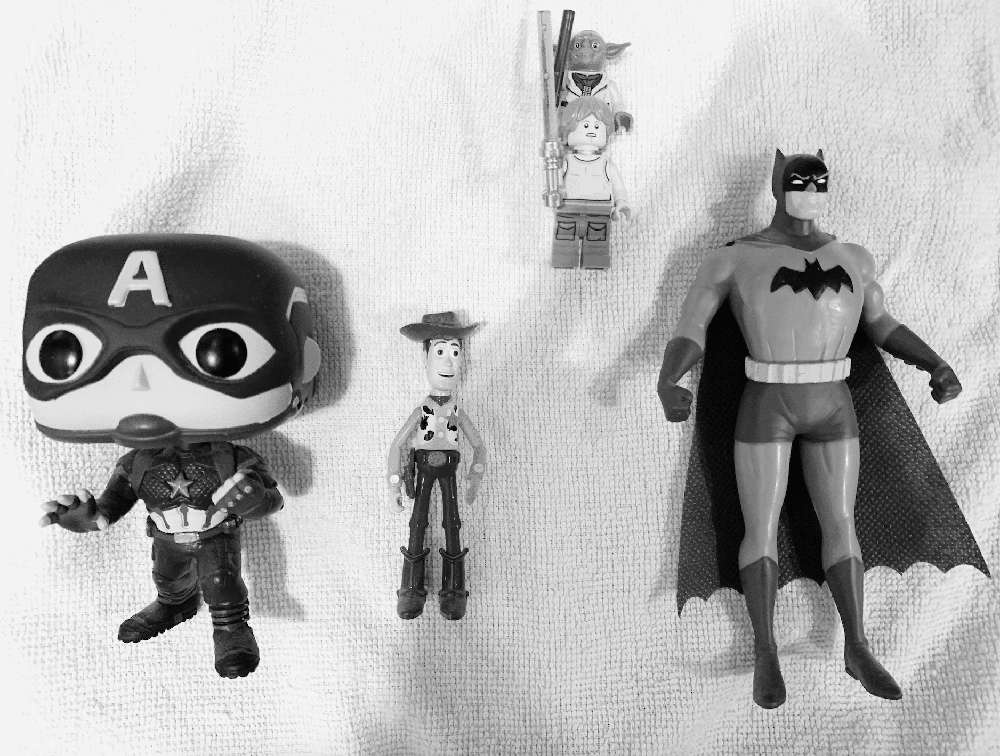

In [948]:
image1_gray = cv.cvtColor(image1, cv.COLOR_BGR2GRAY)
image2_gray = cv.cvtColor(image2, cv.COLOR_BGR2GRAY)
image3_gray = cv.cvtColor(image3, cv.COLOR_BGR2GRAY)
image4_gray = cv.cvtColor(image4, cv.COLOR_BGR2GRAY)
image5_gray = cv.cvtColor(image5, cv.COLOR_BGR2GRAY)
image6_gray = cv.cvtColor(image6, cv.COLOR_BGR2GRAY)

cv2_imshow(image6_gray)

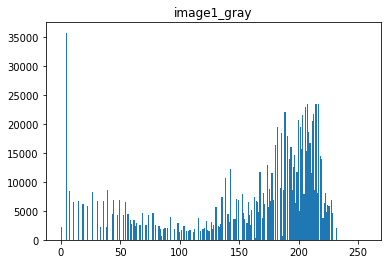

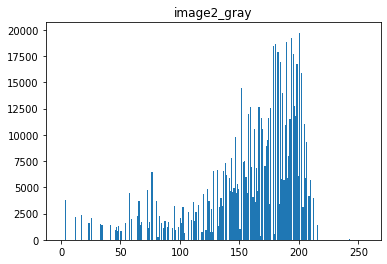

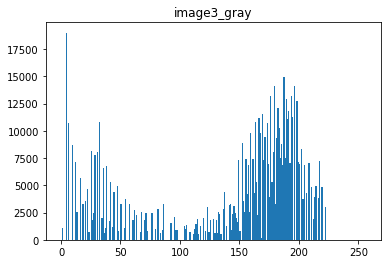

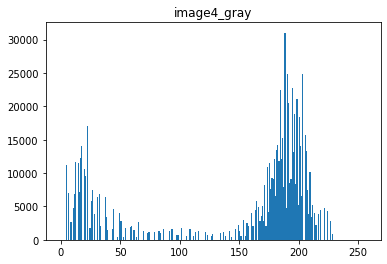

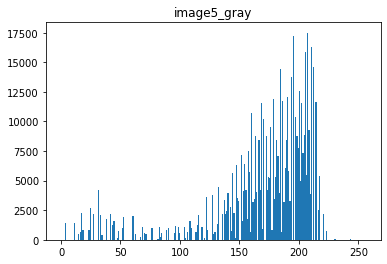

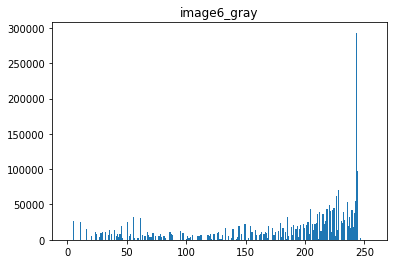

In [949]:
images=[image1_gray,image2_gray,image3_gray,image4_gray,image5_gray,image6_gray]
images_name=['image1_gray','image2_gray','image3_gray','image4_gray','image5_gray','image6_gray']

for i,v in enumerate(images):
  plt.hist(v.flatten(), 256, [0,256])
  plt.title('{}'.format(images_name[i]))
  plt.show()

# **Filtering and Thresholding**

In [950]:
def filtering_median(image,kernel):
  blur = cv.medianBlur(image, kernel)
  return blur

In [951]:
image1_gray_blur= filtering_median(image1_gray,3)
image2_gray_blur= filtering_median(image2_gray,3)
image3_gray_blur= filtering_median(image3_gray,3)
image4_gray_blur= filtering_median(image4_gray,3)
image5_gray_blur= filtering_median(image5_gray,3)
image6_gray_blur= filtering_median(image6_gray,3)

images_gray_blur=[image1_gray_blur,image2_gray_blur,image3_gray_blur,image4_gray_blur,image5_gray_blur,image6_gray_blur]

139.0


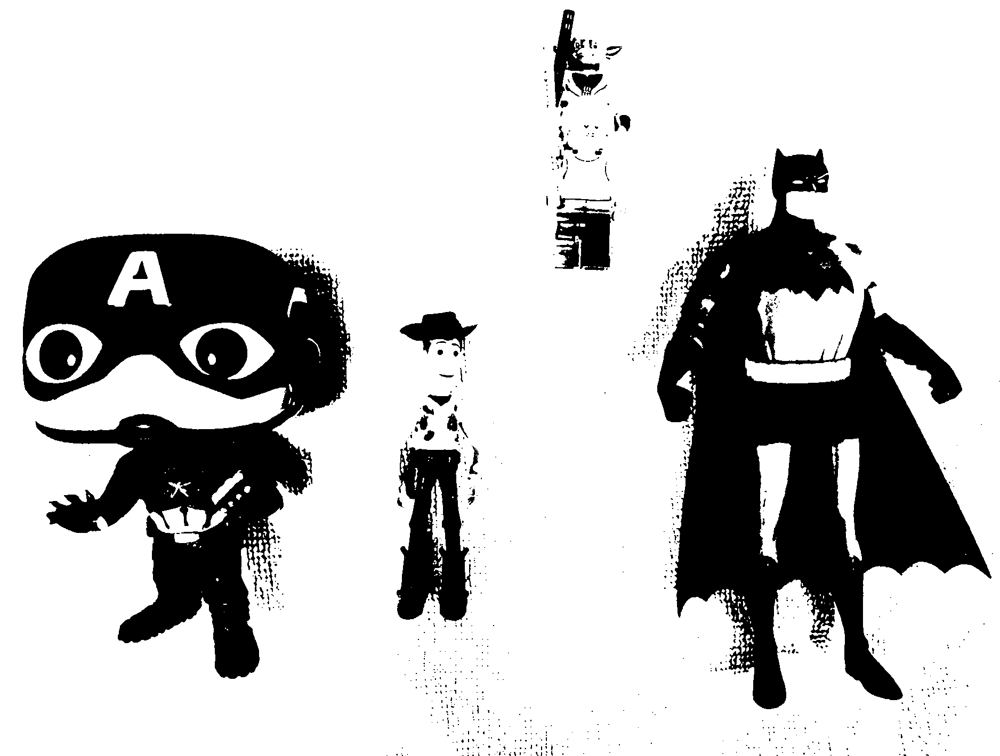

In [952]:
thresholding_value1, thresholding_result1 = cv.threshold(image1_gray_blur, 150, 255, cv.THRESH_BINARY)
thresholding_value2, thresholding_result2 = cv.threshold(image2_gray_blur, 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)
thresholding_value3, thresholding_result3 = cv.threshold(image3_gray_blur, 140, 255, cv.THRESH_BINARY)
thresholding_value4, thresholding_result4 = cv.threshold(image4_gray_blur, 153, 255, cv.THRESH_BINARY)
thresholding_value5, thresholding_result5 = cv.threshold(image5_gray_blur, 155, 255, cv.THRESH_BINARY)
thresholding_value6, thresholding_result6 = cv.threshold(image6_gray_blur, 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)


print(thresholding_value6)
cv2_imshow(thresholding_result6)

# **Image 1-min (BatMan)**

In [953]:
thresholding_result1 = cv.bitwise_not(thresholding_result1)
contours, hierarchy = cv.findContours(thresholding_result1, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
print(contours)

[array([[[ 702, 1249]],

       [[ 703, 1249]]], dtype=int32), array([[[  45, 1249]],

       [[  46, 1249]]], dtype=int32), array([[[  35, 1249]],

       [[  36, 1249]]], dtype=int32), array([[[  56, 1248]],

       [[  55, 1249]],

       [[  57, 1249]]], dtype=int32), array([[[ 750, 1247]],

       [[ 750, 1248]],

       [[ 751, 1249]],

       [[ 751, 1248]],

       [[ 752, 1247]]], dtype=int32), array([[[ 767, 1246]],

       [[ 768, 1246]]], dtype=int32), array([[[ 733, 1246]],

       [[ 733, 1248]],

       [[ 734, 1249]],

       [[ 737, 1249]],

       [[ 737, 1248]],

       [[ 735, 1246]]], dtype=int32), array([[[ 246, 1246]],

       [[ 247, 1246]]], dtype=int32), array([[[ 758, 1245]],

       [[ 757, 1246]],

       [[ 757, 1247]],

       [[ 758, 1248]],

       [[ 759, 1248]],

       [[ 760, 1247]],

       [[ 760, 1246]],

       [[ 759, 1245]]], dtype=int32), array([[[ 717, 1245]],

       [[ 717, 1247]],

       [[ 718, 1248]],

       [[ 719, 1248]],

       [[

In [954]:
area_array=[]
for index, contour in enumerate(contours):
  x, y, w, h = cv.boundingRect(contour)
  area = cv.contourArea(contour)
  area_array.append([index,area,w,h])
  print("Contour #" + str(index), x, y, w, h, area)

Contour #0 702 1249 2 1 0.0
Contour #1 45 1249 2 1 0.0
Contour #2 35 1249 2 1 0.0
Contour #3 55 1248 3 2 1.0
Contour #4 750 1247 3 3 2.0
Contour #5 767 1246 2 1 0.0
Contour #6 733 1246 5 4 9.5
Contour #7 246 1246 2 1 0.0
Contour #8 757 1245 4 4 7.0
Contour #9 717 1245 3 4 4.0
Contour #10 357 1245 2 1 0.0
Contour #11 209 1245 2 2 0.5
Contour #12 516 1243 3 7 6.5
Contour #13 750 1242 2 1 0.0
Contour #14 550 1241 2 2 1.0
Contour #15 227 1241 3 2 1.0
Contour #16 105 1241 3 4 3.0
Contour #17 583 1240 4 5 8.5
Contour #18 95 1240 5 3 6.5
Contour #19 81 1240 2 4 3.0
Contour #20 701 1239 2 2 1.0
Contour #21 409 1239 2 1 0.0
Contour #22 57 1239 6 8 5.5
Contour #23 590 1238 2 2 1.0
Contour #24 440 1238 2 1 0.0
Contour #25 330 1238 2 2 1.0
Contour #26 576 1237 3 5 6.5
Contour #27 339 1237 2 3 1.5
Contour #28 88 1237 3 5 5.0
Contour #29 263 1236 2 4 3.0
Contour #30 208 1236 2 1 0.0
Contour #31 142 1236 3 5 6.0
Contour #32 25 1236 4 10 17.0
Contour #33 810 1235 2 2 1.0
Contour #34 793 1235 2 3 2.0
C

In [955]:
df_area=pd.DataFrame(area_array)
df_area.columns = ['index','area','width','height']
df_sort=df_area.sort_values(by=['area'],ascending=False)
df_sort.head(10)

,index,area,width,height
1084,1084,301575.0,590,998
354,354,125.0,9,46
1055,1055,112.5,8,41
438,438,111.5,15,31
678,678,108.5,12,41
505,505,89.5,6,44
1044,1044,87.5,6,37
386,386,82.5,7,30
381,381,79.5,6,32
658,658,73.0,7,29


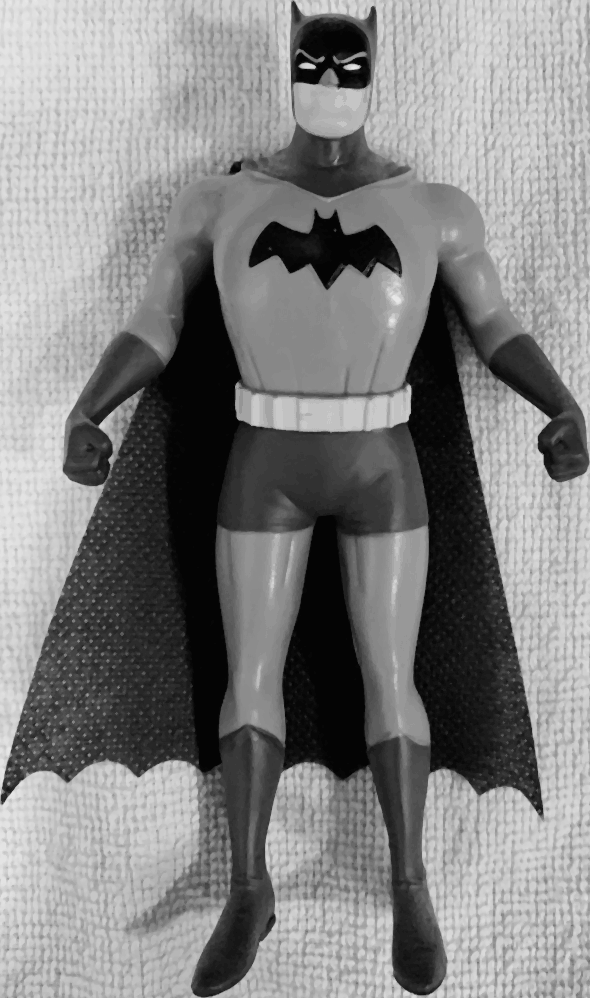

In [956]:
x, y, w, h = cv.boundingRect(contours[1084])
batman = image1_gray_blur[y:y+h, x:x+w]
cv2_imshow(batman)

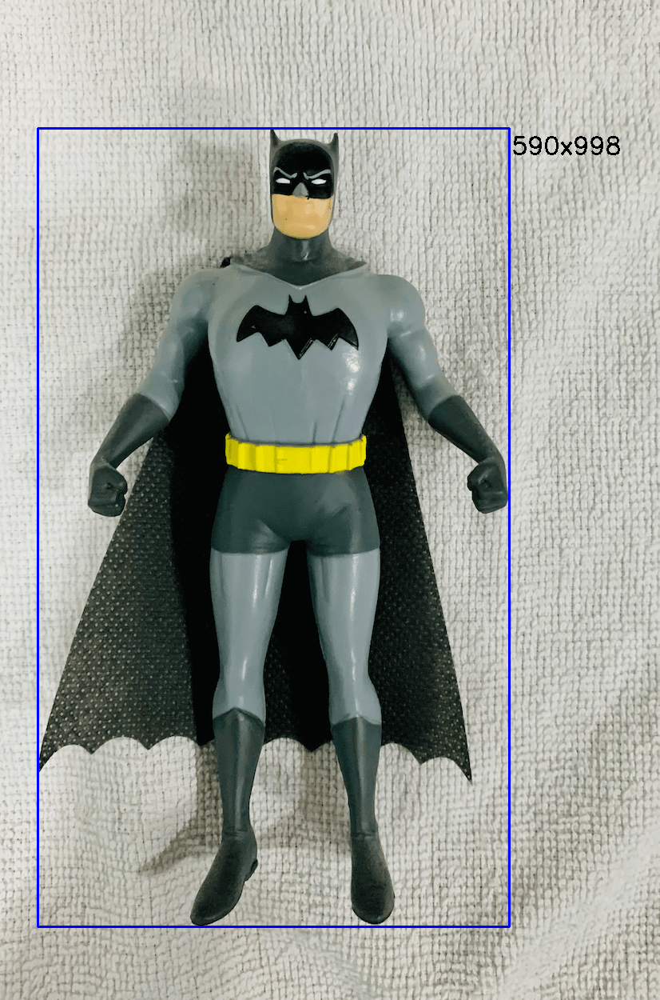

In [957]:
cv.rectangle(image1, (x,y), (x+w,y+h), (255,0,0), 2)

font= cv.FONT_HERSHEY_SIMPLEX
bottomRightCornerOfText = (640,192)
fontScale = 1
fontColor = (0,0,0)
lineType = 2
cv.putText(image1,'590x998', bottomRightCornerOfText, font, fontScale,fontColor,lineType)
cv2_imshow(image1)

# **Image 2-min (Lego Starwars)**

In [958]:
thresholding_result2 = cv.bitwise_not(thresholding_result2)
contours, hierarchy = cv.findContours(thresholding_result2, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
print(contours)

[array([[[ 159, 1035]],

       [[ 160, 1035]]], dtype=int32), array([[[ 699, 1034]],

       [[ 698, 1035]],

       [[ 699, 1035]]], dtype=int32), array([[[ 632, 1034]],

       [[ 631, 1035]],

       [[ 633, 1035]]], dtype=int32), array([[[ 170, 1034]],

       [[ 170, 1035]],

       [[ 172, 1035]],

       [[ 172, 1034]]], dtype=int32), array([[[ 104, 1034]],

       [[ 103, 1035]],

       [[ 105, 1035]]], dtype=int32), array([[[ 359, 1033]],

       [[ 359, 1034]]], dtype=int32), array([[[ 324, 1033]],

       [[ 324, 1035]],

       [[ 325, 1035]],

       [[ 325, 1033]]], dtype=int32), array([[[ 679, 1032]],

       [[ 677, 1034]],

       [[ 677, 1035]],

       [[ 680, 1035]],

       [[ 680, 1032]]], dtype=int32), array([[[ 300, 1032]],

       [[ 299, 1033]],

       [[ 299, 1034]],

       [[ 300, 1034]],

       [[ 301, 1033]],

       [[ 301, 1032]]], dtype=int32), array([[[ 264, 1032]],

       [[ 264, 1035]],

       [[ 265, 1035]],

       [[ 265, 1032]]], dtype=int

In [959]:
area_array=[]
for index, contour in enumerate(contours):
  x, y, w, h = cv.boundingRect(contour)
  area = cv.contourArea(contour)
  area_array.append([index,area,w,h])
  print("Contour #" + str(index), x, y, w, h, area)

Contour #0 159 1035 2 1 0.0
Contour #1 698 1034 2 2 0.5
Contour #2 631 1034 3 2 1.0
Contour #3 170 1034 3 2 2.0
Contour #4 103 1034 3 2 1.0
Contour #5 359 1033 1 2 0.0
Contour #6 324 1033 2 3 2.0
Contour #7 677 1032 4 4 7.0
Contour #8 299 1032 3 3 3.0
Contour #9 264 1032 2 4 3.0
Contour #10 31 1032 3 3 2.5
Contour #11 28 1032 2 2 1.0
Contour #12 687 1031 3 5 7.5
Contour #13 439 1031 2 3 2.0
Contour #14 403 1031 2 3 1.5
Contour #15 228 1031 2 4 2.5
Contour #16 216 1031 3 5 7.0
Contour #17 116 1031 3 4 4.0
Contour #18 71 1031 4 3 4.5
Contour #19 312 1030 2 6 5.0
Contour #20 276 1030 2 1 0.0
Contour #21 158 1030 2 3 2.0
Contour #22 85 1030 3 3 2.5
Contour #23 128 1029 2 3 2.0
Contour #24 60 1029 3 3 3.5
Contour #25 181 1028 3 8 9.5
Contour #26 170 1028 2 3 2.0
Contour #27 240 1027 4 9 14.0
Contour #28 597 1026 3 2 1.0
Contour #29 7 1026 7 5 10.5
Contour #30 324 1025 2 3 2.0
Contour #31 28 1024 3 4 4.0
Contour #32 415 1023 3 11 9.0
Contour #33 288 1023 2 3 2.0
Contour #34 678 1022 3 7 6.5


In [960]:
df_area=pd.DataFrame(area_array)
df_area.columns = ['index','area','width','height']
df_sort=df_area.sort_values(by=['area'],ascending=False)
df_sort.head(10)

,index,area,width,height
904,904,111041.0,305,627
463,463,632.5,76,22
453,453,451.0,18,66
599,599,206.5,11,40
755,755,188.0,10,57
610,610,181.0,12,67
769,769,175.5,15,48
531,531,167.0,10,38
365,365,151.5,8,37
637,637,149.5,14,40


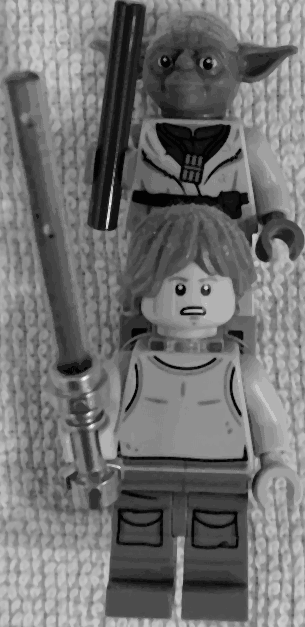

In [961]:
x, y, w, h = cv.boundingRect(contours[904])
lego = image2_gray_blur[y:y+h, x:x+w]
cv2_imshow(lego)

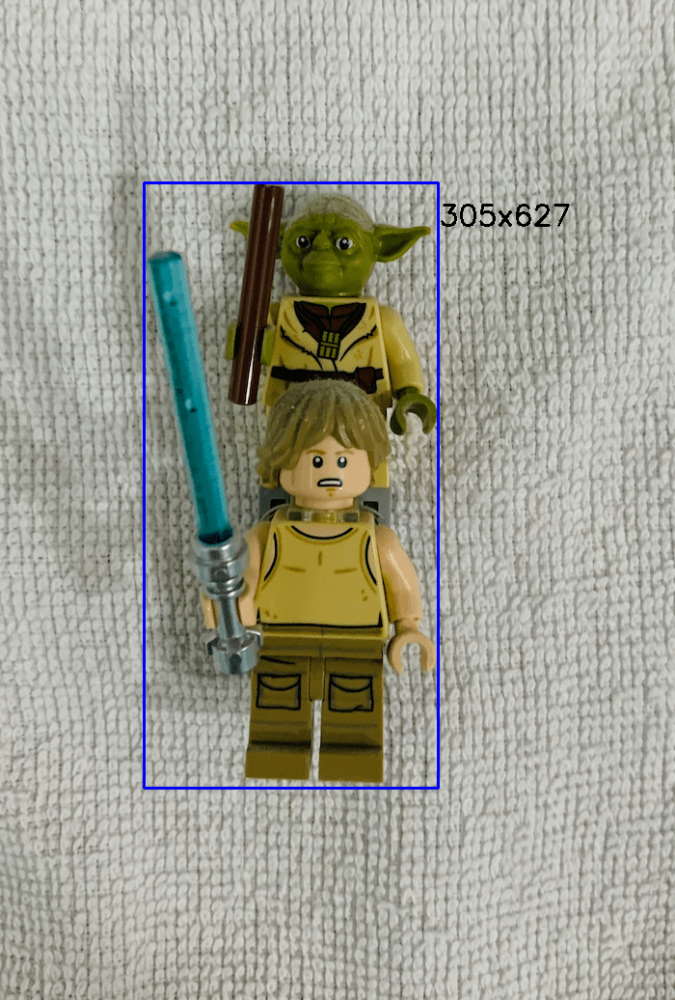

In [962]:
cv.rectangle(image2, (x,y), (x+w,y+h), (255,0,0), 2)

font= cv.FONT_HERSHEY_SIMPLEX
bottomRightCornerOfText = (455,233)
fontScale = 1
fontColor = (0,0,0)
lineType = 2
cv.putText(image2,'305x627', bottomRightCornerOfText, font, fontScale,fontColor,lineType)
cv2_imshow(image2)

# **Image 3-min (Harry)**

In [963]:
thresholding_result3 = cv.bitwise_not(thresholding_result3)
contours, hierarchy = cv.findContours(thresholding_result3, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
print(contours)

[array([[[149, 856]],

       [[150, 856]]], dtype=int32), array([[[215, 765]],

       [[215, 766]],

       [[216, 766]],

       [[216, 765]]], dtype=int32), array([[[218, 752]],

       [[215, 755]],

       [[215, 756]],

       [[216, 757]],

       [[216, 759]],

       [[217, 759]],

       [[219, 757]],

       [[219, 756]],

       [[218, 755]],

       [[218, 754]],

       [[219, 753]]], dtype=int32), array([[[545, 749]],

       [[545, 750]],

       [[546, 750]],

       [[546, 749]]], dtype=int32), array([[[208, 745]],

       [[208, 746]],

       [[209, 746]],

       [[209, 745]]], dtype=int32), array([[[544, 736]],

       [[544, 738]],

       [[545, 739]],

       [[545, 741]],

       [[546, 742]],

       [[546, 737]],

       [[545, 736]]], dtype=int32), array([[[205, 728]],

       [[205, 729]],

       [[207, 729]],

       [[207, 728]]], dtype=int32), array([[[518, 722]],

       [[518, 723]],

       [[519, 723]],

       [[519, 722]]], dtype=int32), array([

In [964]:
area_array=[]
for index, contour in enumerate(contours):
  x, y, w, h = cv.boundingRect(contour)
  area = cv.contourArea(contour)
  area_array.append([index,area,w,h])
  print("Contour #" + str(index), x, y, w, h, area)

Contour #0 149 856 2 1 0.0
Contour #1 215 765 2 2 1.0
Contour #2 215 752 5 8 16.5
Contour #3 545 749 2 2 1.0
Contour #4 208 745 2 2 1.0
Contour #5 544 736 3 7 7.5
Contour #6 205 728 3 2 2.0
Contour #7 518 722 2 2 1.0
Contour #8 461 722 6 10 16.0
Contour #9 526 720 3 6 8.0
Contour #10 454 718 2 2 1.0
Contour #11 198 716 5 6 13.0
Contour #12 205 715 4 5 8.5
Contour #13 481 714 2 2 1.0
Contour #14 527 711 3 5 7.5
Contour #15 443 703 3 4 4.5
Contour #16 528 702 1 1 0.0
Contour #17 534 697 5 8 18.0
Contour #18 481 697 6 15 24.5
Contour #19 526 689 4 4 5.5
Contour #20 473 684 3 5 6.5
Contour #21 534 679 5 15 27.0
Contour #22 525 672 3 7 10.5
Contour #23 566 671 2 3 1.5
Contour #24 482 670 3 5 6.0
Contour #25 499 669 4 7 12.0
Contour #26 553 667 3 5 3.0
Contour #27 468 665 2 1 0.0
Contour #28 534 662 4 7 14.5
Contour #29 510 662 3 4 5.0
Contour #30 518 660 10 7 37.5
Contour #31 501 659 2 1 0.0
Contour #32 566 658 3 7 10.0
Contour #33 482 658 8 9 21.0
Contour #34 147 658 4 4 4.0
Contour #35 15

In [965]:
df_area=pd.DataFrame(area_array)
df_area.columns = ['index','area','width','height']
df_sort=df_area.sort_values(by=['area'],ascending=False)
df_sort.head(10)

,index,area,width,height
153,153,237894.0,525,683
68,68,2257.0,45,123
53,53,450.5,26,23
49,49,411.0,26,22
124,124,313.0,18,58
41,41,152.0,14,33
66,66,149.0,13,29
99,99,144.5,10,51
76,76,122.5,15,30
144,144,110.0,5,53


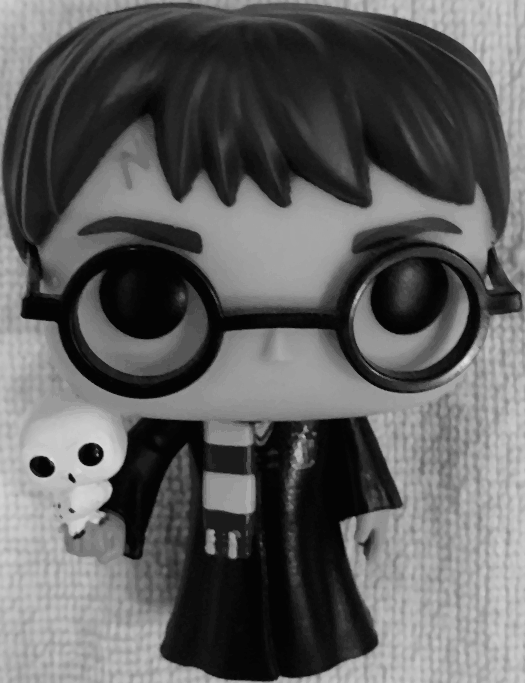

In [966]:
x, y, w, h = cv.boundingRect(contours[153])
harry = image3_gray_blur[y:y+h, x:x+w]
cv2_imshow(harry)

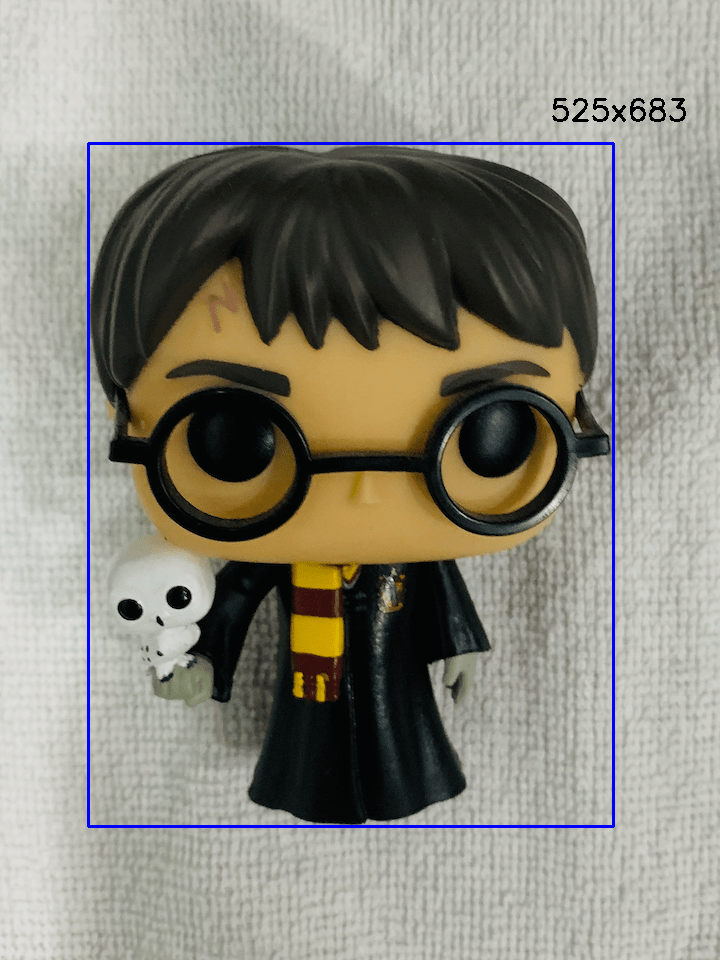

In [967]:
cv.rectangle(image3, (x,y), (x+w,y+h), (255,0,0), 2)

font= cv.FONT_HERSHEY_SIMPLEX
bottomRightCornerOfText = (550,120)
fontScale = 1
fontColor = (0,0,0)
lineType = 2
cv.putText(image3,'525x683', bottomRightCornerOfText, font, fontScale,fontColor,lineType)
cv2_imshow(image3)

# **Image 4-min (Captain America)**

In [968]:
thresholding_result4 = cv.bitwise_not(thresholding_result4)
contours, hierarchy = cv.findContours(thresholding_result4, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
print(contours)

[array([[[ 565, 1112]],

       [[ 565, 1114]],

       [[ 566, 1114]],

       [[ 566, 1112]]], dtype=int32), array([[[  49, 1112]],

       [[  48, 1113]],

       [[  48, 1114]],

       [[  49, 1114]]], dtype=int32), array([[[ 218, 1103]],

       [[ 217, 1104]],

       [[ 217, 1106]],

       [[ 218, 1106]],

       [[ 218, 1105]],

       [[ 219, 1104]]], dtype=int32), array([[[ 556, 1099]],

       [[ 555, 1100]],

       [[ 556, 1101]],

       [[ 557, 1101]],

       [[ 558, 1100]],

       [[ 557, 1099]]], dtype=int32), array([[[ 521, 1099]],

       [[ 520, 1100]],

       [[ 520, 1101]],

       [[ 521, 1102]],

       [[ 523, 1100]],

       [[ 523, 1099]]], dtype=int32), array([[[ 564, 1098]],

       [[ 563, 1099]],

       [[ 564, 1100]],

       [[ 566, 1100]],

       [[ 566, 1099]],

       [[ 565, 1098]]], dtype=int32), array([[[ 545, 1097]],

       [[ 545, 1098]],

       [[ 546, 1099]],

       [[ 547, 1099]],

       [[ 547, 1098]],

       [[ 546, 1097]]], dty

In [969]:
area_array=[]
for index, contour in enumerate(contours):
  x, y, w, h = cv.boundingRect(contour)
  area = cv.contourArea(contour)
  area_array.append([index,area,w,h])
  print("Contour #" + str(index), x, y, w, h, area)

Contour #0 565 1112 2 3 2.0
Contour #1 48 1112 2 3 1.5
Contour #2 217 1103 3 4 3.5
Contour #3 555 1099 4 3 4.0
Contour #4 520 1099 4 4 6.0
Contour #5 563 1098 4 3 4.5
Contour #6 545 1097 3 3 3.0
Contour #7 527 1097 4 3 4.0
Contour #8 536 1095 2 3 2.0
Contour #9 464 1090 2 2 0.5
Contour #10 15 1089 2 2 0.5
Contour #11 580 1083 3 5 5.5
Contour #12 562 1082 5 7 11.0
Contour #13 543 1080 5 4 6.5
Contour #14 579 1072 7 7 22.0
Contour #15 562 1072 2 1 0.0
Contour #16 544 1069 4 4 7.5
Contour #17 599 1062 6 17 29.5
Contour #18 554 1058 3 5 6.5
Contour #19 545 1058 4 4 6.0
Contour #20 572 1057 4 4 5.0
Contour #21 536 1057 3 4 4.0
Contour #22 562 1054 6 10 26.5
Contour #23 599 1046 4 6 9.0
Contour #24 563 1045 4 5 8.0
Contour #25 453 1035 4 5 8.0
Contour #26 518 1033 3 3 2.5
Contour #27 590 1031 4 7 12.5
Contour #28 571 1029 5 9 27.5
Contour #29 629 1020 4 8 12.5
Contour #30 565 1019 2 2 1.0
Contour #31 572 1018 4 3 4.0
Contour #32 607 1017 8 23 75.5
Contour #33 639 1011 3 3 2.5
Contour #34 370

In [970]:
df_area=pd.DataFrame(area_array)
df_area.columns = ['index','area','width','height']
df_sort=df_area.sort_values(by=['area'],ascending=False)
df_sort.head(10)

,index,area,width,height
139,139,251972.5,527,857
104,104,390.0,16,50
127,127,319.5,18,50
133,133,316.5,19,53
107,107,112.5,7,31
140,140,85.5,7,28
32,32,75.5,8,23
48,48,70.0,7,22
126,126,63.5,7,23
56,56,53.0,13,9


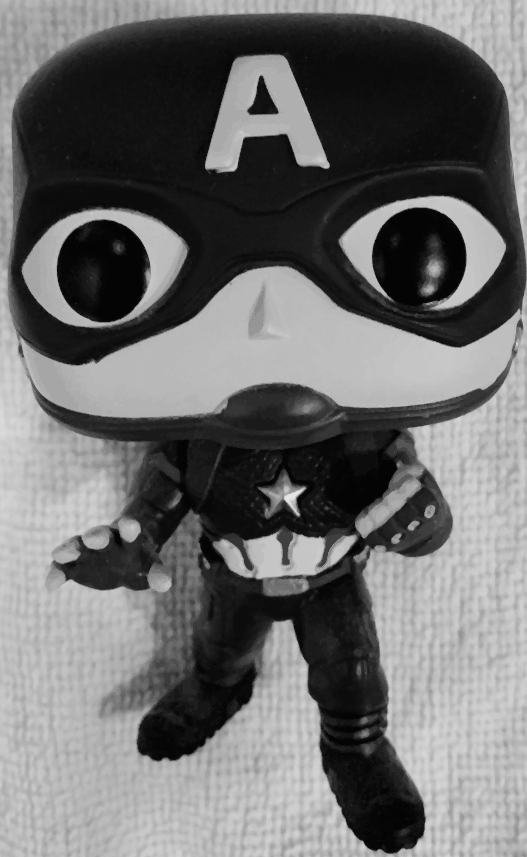

In [971]:
x, y, w, h = cv.boundingRect(contours[139])
Cap = image4_gray_blur[y:y+h, x:x+w]
cv2_imshow(Cap)

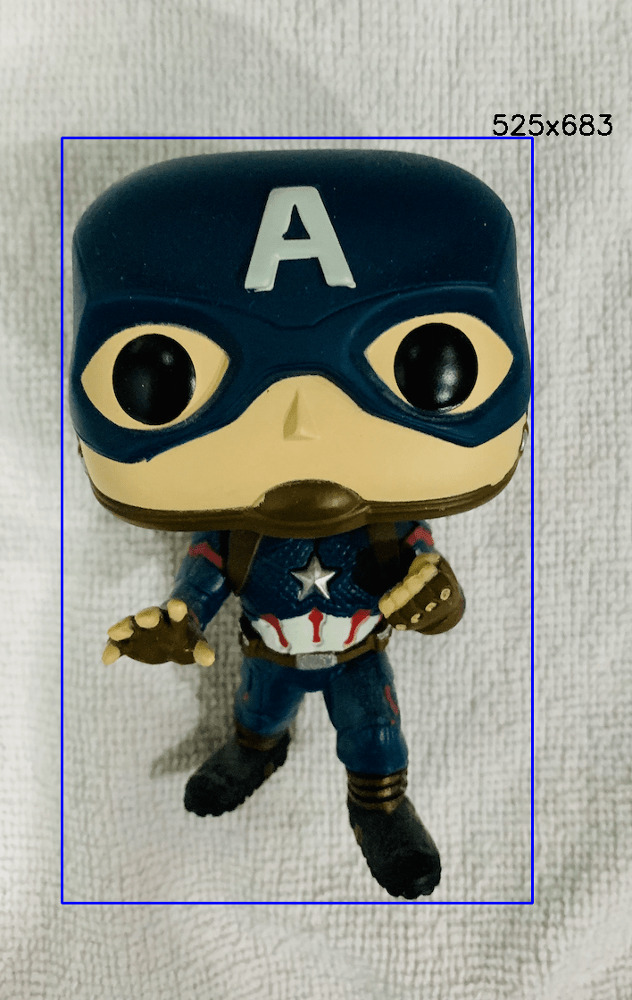

In [972]:
cv.rectangle(image4, (x,y), (x+w,y+h), (255,0,0), 2)

font= cv.FONT_HERSHEY_SIMPLEX
bottomRightCornerOfText = (550,150)
fontScale = 1
fontColor = (0,0,0)
lineType = 2
cv.putText(image4,'525x683', bottomRightCornerOfText, font, fontScale,fontColor,lineType)
cv2_imshow(image4)

# **Image 5-min (woody)**

In [973]:
thresholding_result5 = cv.bitwise_not(thresholding_result5)
contours, hierarchy = cv.findContours(thresholding_result5, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
print(contours)

[array([[[214, 971]],

       [[218, 971]]], dtype=int32), array([[[ 33, 971]],

       [[ 34, 971]]], dtype=int32), array([[[  8, 971]]], dtype=int32), array([[[477, 970]],

       [[476, 971]],

       [[479, 971]],

       [[478, 970]]], dtype=int32), array([[[451, 970]],

       [[450, 971]],

       [[453, 971]],

       [[452, 970]]], dtype=int32), array([[[505, 969]],

       [[504, 970]],

       [[501, 970]],

       [[500, 971]],

       [[507, 971]]], dtype=int32), array([[[191, 969]],

       [[190, 970]],

       [[187, 970]],

       [[186, 971]],

       [[192, 971]],

       [[192, 969]]], dtype=int32), array([[[138, 969]],

       [[136, 971]],

       [[133, 971]],

       [[138, 971]]], dtype=int32), array([[[ 17, 969]],

       [[ 16, 970]],

       [[ 15, 970]],

       [[ 14, 971]],

       [[ 18, 971]],

       [[ 18, 970]]], dtype=int32), array([[[513, 967]],

       [[511, 969]],

       [[511, 971]],

       [[515, 971]],

       [[514, 970]],

       [[514, 9

In [974]:
area_array=[]
for index, contour in enumerate(contours):
  x, y, w, h = cv.boundingRect(contour)
  area = cv.contourArea(contour)
  area_array.append([index,area,w,h])
  print("Contour #" + str(index), x, y, w, h, area)

Contour #0 214 971 5 1 0.0
Contour #1 33 971 2 1 0.0
Contour #2 8 971 1 1 0.0
Contour #3 476 970 4 2 2.0
Contour #4 450 970 4 2 2.0
Contour #5 500 969 8 3 7.0
Contour #6 186 969 7 3 7.0
Contour #7 133 969 6 3 2.0
Contour #8 14 969 5 3 4.5
Contour #9 511 967 5 5 10.0
Contour #10 455 967 3 2 1.0
Contour #11 428 967 7 5 13.0
Contour #12 222 967 5 3 5.0
Contour #13 464 966 2 2 1.0
Contour #14 232 966 4 6 7.5
Contour #15 196 966 6 4 9.5
Contour #16 100 966 4 3 4.5
Contour #17 90 966 4 5 9.0
Contour #18 82 966 3 3 2.5
Contour #19 468 965 4 7 7.5
Contour #20 408 965 6 7 19.0
Contour #21 308 965 6 5 11.5
Contour #22 248 965 3 7 9.0
Contour #23 176 965 1 2 0.0
Contour #24 110 965 5 5 9.0
Contour #25 482 964 9 8 26.5
Contour #26 417 964 7 8 28.5
Contour #27 391 964 6 8 27.5
Contour #28 70 964 4 4 7.0
Contour #29 142 963 9 8 15.5
Contour #30 139 963 3 2 1.0
Contour #31 0 963 1 4 0.0
Contour #32 575 962 1 3 0.0
Contour #33 556 962 1 2 0.0
Contour #34 297 962 3 4 4.5
Contour #35 121 962 5 4 9.5
Con

In [975]:
df_area=pd.DataFrame(area_array)
df_area.columns = ['index','area','width','height']
df_sort=df_area.sort_values(by=['area'],ascending=False)
df_sort.head(10)

,index,area,width,height
2275,2275,72944.5,239,603
1219,1219,432.5,29,114
311,311,290.5,31,49
1654,1654,244.5,20,20
1771,1771,221.5,23,22
1453,1453,192.5,8,78
1918,1918,187.5,34,38
195,195,187.0,10,45
103,103,181.5,28,28
229,229,179.5,20,54


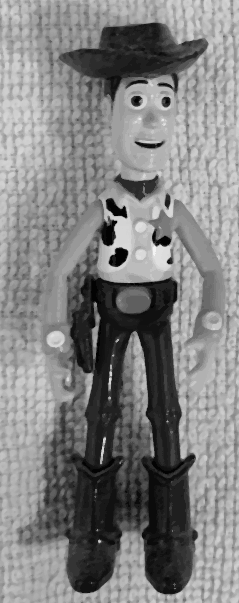

In [976]:
x, y, w, h = cv.boundingRect(contours[2275])
woody = image5_gray_blur[y:y+h, x:x+w]
cv2_imshow(woody)

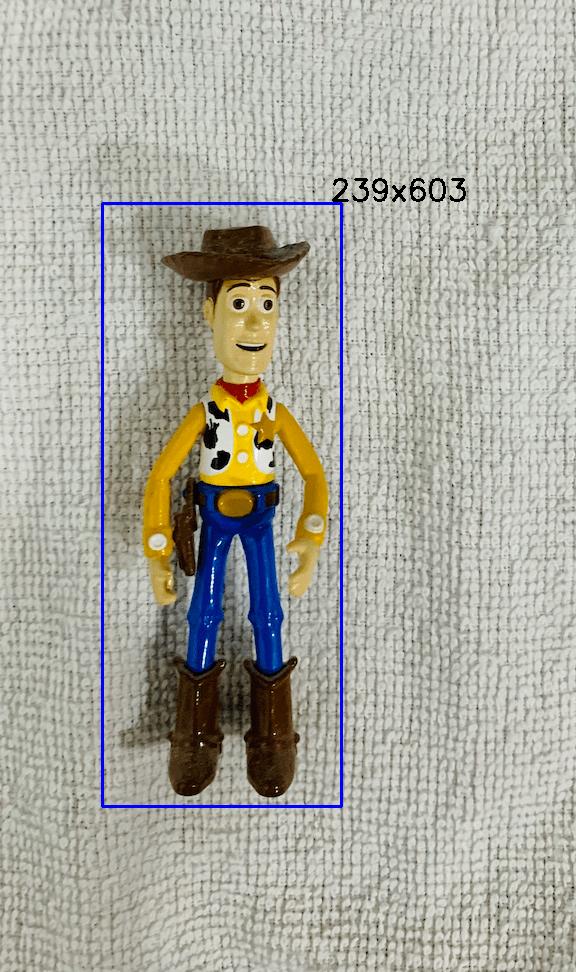

In [977]:
cv.rectangle(image5, (x,y), (x+w,y+h), (255,0,0), 2)

font= cv.FONT_HERSHEY_SIMPLEX
bottomRightCornerOfText = (330,200)
fontScale = 1
fontColor = (0,0,0)
lineType = 2
cv.putText(image5,'239x603', bottomRightCornerOfText, font, fontScale,fontColor,lineType)
cv2_imshow(image5)

# **Image 6-min (ALL)**

## **box batman and captain america**

In [978]:

thresholding_value6, thresholding_result6 = cv.threshold(image6_gray_blur, 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)

In [979]:
thresholding_result6 = cv.bitwise_not(thresholding_result6)
contours, hierarchy = cv.findContours(thresholding_result6, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
print(contours)

[array([[[ 867, 1419]],

       [[ 869, 1419]]], dtype=int32), array([[[ 725, 1419]],

       [[ 726, 1419]]], dtype=int32), array([[[1591, 1418]],

       [[1590, 1419]],

       [[1592, 1419]]], dtype=int32), array([[[1558, 1418]],

       [[1559, 1418]]], dtype=int32), array([[[1457, 1418]],

       [[1457, 1419]],

       [[1458, 1419]],

       [[1458, 1418]]], dtype=int32), array([[[ 877, 1418]],

       [[ 877, 1419]],

       [[ 879, 1419]],

       [[ 878, 1418]]], dtype=int32), array([[[ 754, 1418]],

       [[ 754, 1419]],

       [[ 755, 1419]],

       [[ 755, 1418]]], dtype=int32), array([[[1737, 1417]],

       [[1737, 1418]],

       [[1739, 1418]],

       [[1740, 1419]],

       [[1742, 1419]],

       [[1740, 1417]]], dtype=int32), array([[[1695, 1417]],

       [[1695, 1418]],

       [[1696, 1419]],

       [[1699, 1419]],

       [[1699, 1418]],

       [[1698, 1417]]], dtype=int32), array([[[1024, 1417]],

       [[1024, 1418]],

       [[1025, 1418]],

       [[

In [980]:
area_array=[]
for index, contour in enumerate(contours):
  x, y, w, h = cv.boundingRect(contour)
  area = cv.contourArea(contour)
  area_array.append([index,area,w,h])
  print("Contour #" + str(index), x, y, w, h, area)

Contour #0 867 1419 3 1 0.0
Contour #1 725 1419 2 1 0.0
Contour #2 1590 1418 3 2 1.0
Contour #3 1558 1418 2 1 0.0
Contour #4 1457 1418 2 2 1.0
Contour #5 877 1418 3 2 1.5
Contour #6 754 1418 2 2 1.0
Contour #7 1737 1417 6 3 5.5
Contour #8 1695 1417 5 3 7.0
Contour #9 1024 1417 2 2 1.0
Contour #10 996 1417 1 2 0.0
Contour #11 886 1417 3 3 3.0
Contour #12 1687 1416 2 2 1.0
Contour #13 1425 1416 2 4 2.5
Contour #14 928 1416 1 1 0.0
Contour #15 916 1416 3 3 2.0
Contour #16 897 1416 3 4 2.5
Contour #17 764 1416 1 2 0.0
Contour #18 743 1416 3 3 3.0
Contour #19 1355 1415 2 1 0.0
Contour #20 1094 1415 2 1 0.0
Contour #21 1055 1415 2 3 2.0
Contour #22 955 1415 3 5 5.5
Contour #23 946 1415 2 3 1.0
Contour #24 753 1415 1 2 0.0
Contour #25 1527 1414 2 2 0.5
Contour #26 1507 1414 3 4 4.0
Contour #27 897 1414 2 1 0.0
Contour #28 877 1414 2 1 0.0
Contour #29 1487 1413 2 1 0.0
Contour #30 1467 1413 2 1 0.0
Contour #31 1143 1413 2 1 0.0
Contour #32 1014 1413 3 7 6.0
Contour #33 982 1413 4 2 0.0
Contour

In [981]:
df_area=pd.DataFrame(area_array)
df_area.columns = ['index','area','width','height']
df_sort=df_area.sort_values(by=['area'],ascending=False)
df_sort.head(10)

,index,area,width,height
858,858,313612.0,627,1053
800,800,267988.5,617,836
619,619,32826.0,141,339
813,813,9183.0,112,121
722,722,5231.0,146,79
896,896,5085.0,87,184
887,887,1352.5,58,44
647,647,463.0,45,22
641,641,431.0,19,33
873,873,393.0,21,31


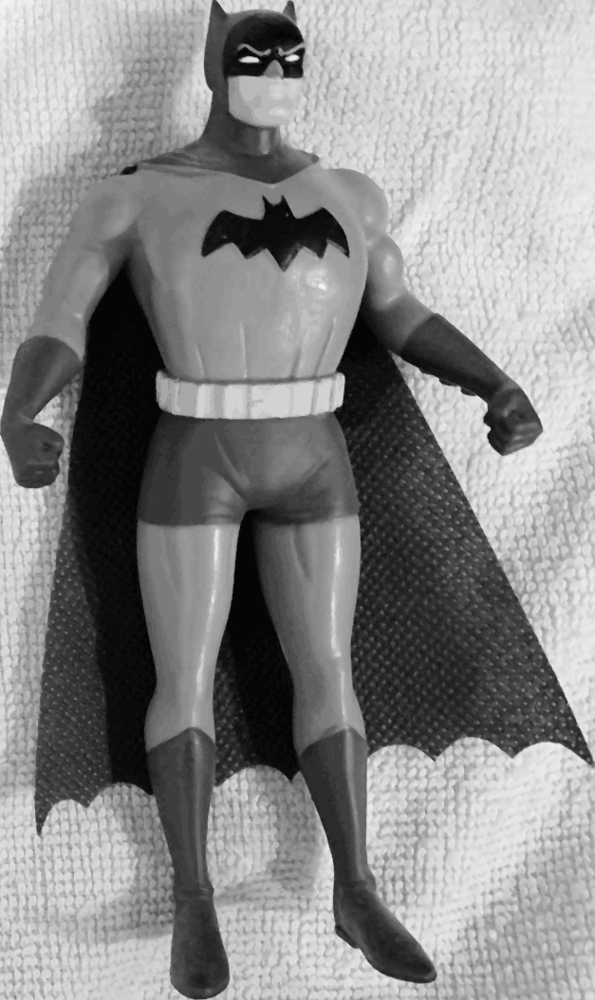

In [982]:
x1, y1, w1, h1 = cv.boundingRect(contours[858])
Batman = image6_gray_blur[y1:y1+h1, x1:x1+w1]
cv2_imshow(Batman)

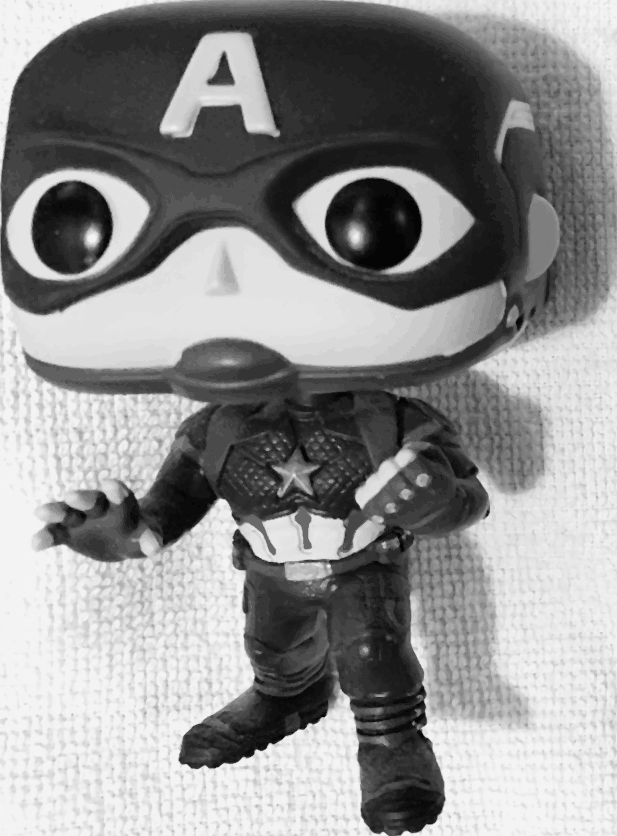

In [983]:
x2, y2, w2, h2 = cv.boundingRect(contours[800])
captain = image6_gray_blur[y2:y2+h2, x2:x2+w2]
cv2_imshow(captain)

## **box woody and starwars**

180.0


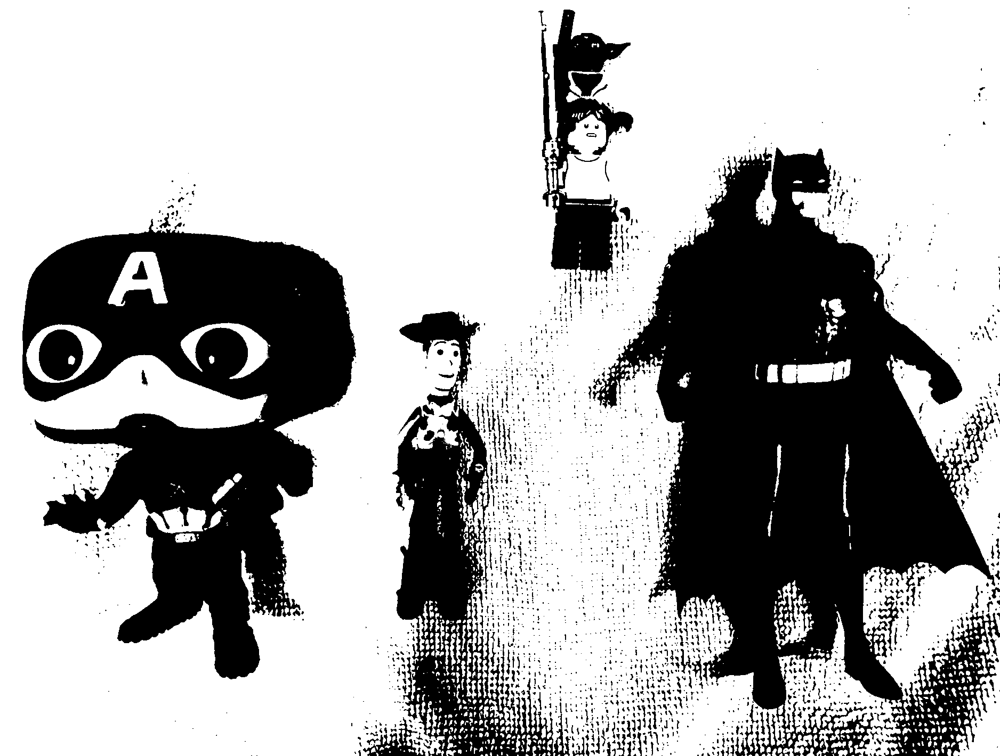

In [984]:
thresholding_value6, thresholding_result6 = cv.threshold(image6_gray_blur, 180, 255, cv.THRESH_BINARY)
print(thresholding_value6)
cv2_imshow(thresholding_result6)

In [985]:
thresholding_result6 = cv.bitwise_not(thresholding_result6)
# cv2_imshow(thresholding_result6)
contours, hierarchy = cv.findContours(thresholding_result6, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
print(contours)

[array([[[1241, 1419]],

       [[1242, 1419]]], dtype=int32), array([[[ 481, 1419]],

       [[ 482, 1419]]], dtype=int32), array([[[ 471, 1419]],

       [[ 472, 1419]]], dtype=int32), array([[[1798, 1418]],

       [[1797, 1419]],

       [[1799, 1419]]], dtype=int32), array([[[1211, 1418]],

       [[1211, 1419]],

       [[1213, 1419]],

       [[1212, 1418]]], dtype=int32), array([[[1649, 1417]],

       [[1648, 1418]],

       [[1649, 1419]],

       [[1653, 1419]],

       [[1652, 1418]],

       [[1650, 1418]]], dtype=int32), array([[[1581, 1417]],

       [[1580, 1418]],

       [[1580, 1419]],

       [[1584, 1419]],

       [[1582, 1417]]], dtype=int32), array([[[1309, 1417]],

       [[1308, 1418]],

       [[1308, 1419]],

       [[1310, 1419]],

       [[1310, 1418]]], dtype=int32), array([[[1536, 1416]],

       [[1536, 1417]],

       [[1535, 1418]],

       [[1535, 1419]],

       [[1537, 1419]],

       [[1537, 1418]],

       [[1538, 1417]],

       [[1537, 1416]]],

In [986]:
area_array=[]
for index, contour in enumerate(contours):
  x, y, w, h = cv.boundingRect(contour)
  area = cv.contourArea(contour)
  area_array.append([index,area,w,h])
  print("Contour #" + str(index), x, y, w, h, area)

Contour #0 1241 1419 2 1 0.0
Contour #1 481 1419 2 1 0.0
Contour #2 471 1419 2 1 0.0
Contour #3 1797 1418 3 2 1.0
Contour #4 1211 1418 3 2 1.5
Contour #5 1648 1417 6 3 5.0
Contour #6 1580 1417 5 3 5.5
Contour #7 1308 1417 3 3 3.0
Contour #8 1535 1416 4 4 5.5
Contour #9 1188 1416 6 4 8.0
Contour #10 840 1416 9 4 11.0
Contour #11 1632 1415 4 5 5.0
Contour #12 1316 1415 4 5 9.5
Contour #13 1639 1414 6 6 14.5
Contour #14 1327 1414 5 6 12.0
Contour #15 1257 1414 3 4 4.0
Contour #16 1336 1412 4 6 6.5
Contour #17 1265 1412 2 2 0.5
Contour #18 665 1412 3 4 3.0
Contour #19 1619 1411 9 9 32.5
Contour #20 1345 1411 4 9 13.5
Contour #21 1473 1409 2 1 0.0
Contour #22 1108 1409 8 8 20.0
Contour #23 672 1409 5 11 23.5
Contour #24 1352 1408 7 12 35.0
Contour #25 1131 1408 3 5 5.0
Contour #26 1808 1407 3 2 1.5
Contour #27 1634 1407 2 1 0.0
Contour #28 1242 1406 2 3 1.0
Contour #29 1148 1406 7 14 27.0
Contour #30 1319 1405 3 3 2.5
Contour #31 803 1405 26 15 116.0
Contour #32 1671 1404 9 7 33.0
Contour #

In [987]:
df_area=pd.DataFrame(area_array)
df_area.columns = ['index','area','width','height']
df_sort=df_area.sort_values(by=['area'],ascending=False)
df_sort.head(10)

,index,area,width,height
2435,2435,434982.5,764,1143
2350,2350,292135.5,626,865
2188,2188,99853.0,334,835
2470,2470,35910.0,173,512
205,205,2747.0,117,73
2461,2461,1573.5,59,45
1893,1893,987.0,38,101
1059,1059,792.5,39,105
654,654,289.0,19,50
2374,2374,268.5,20,26


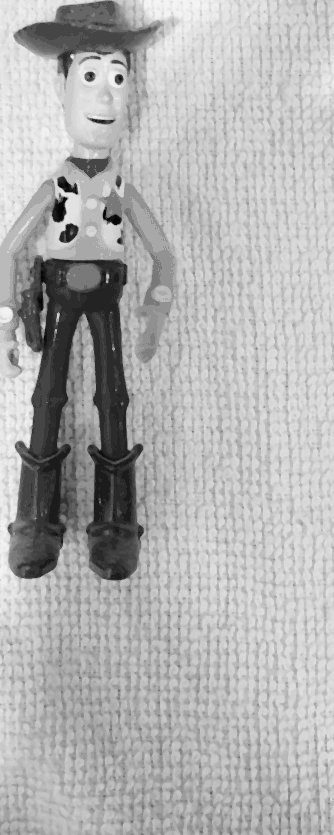

In [988]:
x3, y3, w3, h3 = cv.boundingRect(contours[2188])
woody = image6_gray_blur[y3:y3+h3, x3:x3+w3]
cv2_imshow(woody)

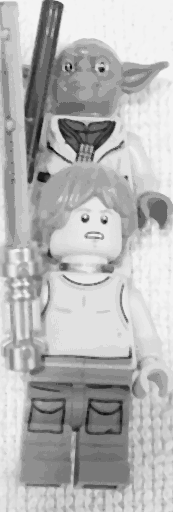

In [989]:
x4, y4, w4, h4 = cv.boundingRect(contours[2470])
starwars = image6_gray_blur[y4:y4+h4, x4:x4+w4]
cv2_imshow(starwars)

## **Hasil Seluruhnya**

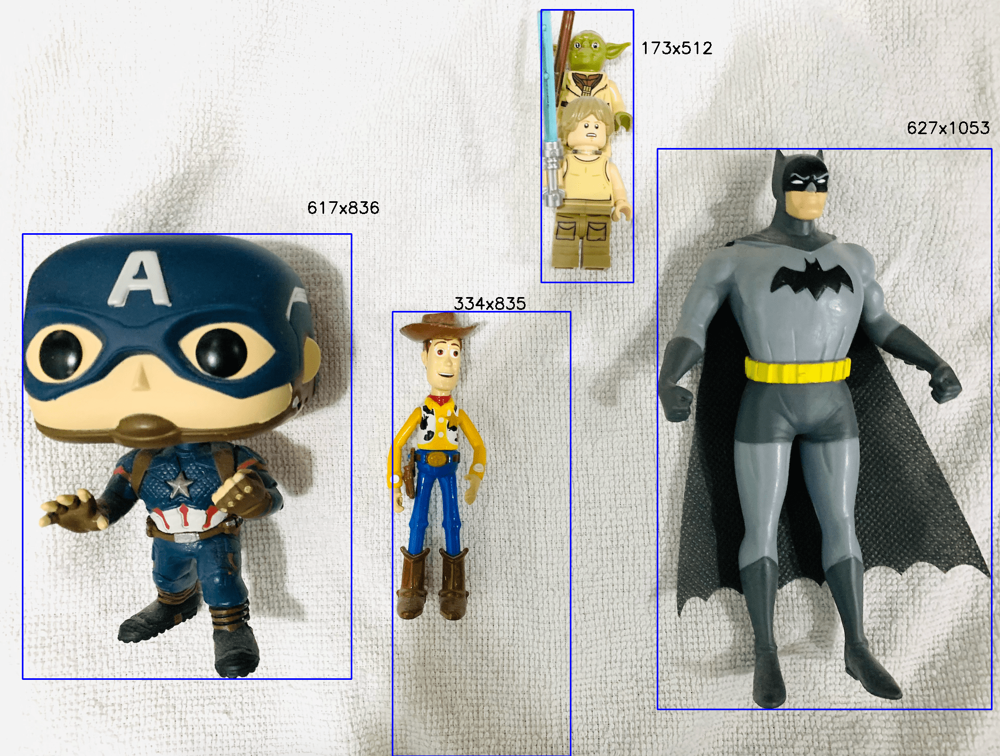

In [990]:
cv.rectangle(image6, (x1,y1), (x1+w1,y1+h1), (255,0,0), 2)
cv.rectangle(image6, (x2,y2), (x2+w2,y2+h2), (255,0,0), 2)
cv.rectangle(image6, (x3,y3), (x3+w3,y3+h3), (255,0,0), 2)
cv.rectangle(image6, (x4,y4), (x4+w4,y4+h4), (255,0,0), 2)

font= cv.FONT_HERSHEY_SIMPLEX
posisi_captain = (575,400)
posisi_woody = (850,580)
posisi_batman = (1700,250)
posisi_starwars = (1200,100)
fontScale = 1
fontColor = (0,0,0)
lineType = 2
cv.putText(image6,'617x836', posisi_captain, font, fontScale,fontColor,lineType)
cv.putText(image6,'334x835', posisi_woody, font, fontScale,fontColor,lineType)
cv.putText(image6,'627x1053', posisi_batman, font, fontScale,fontColor,lineType)
cv.putText(image6,'173x512', posisi_starwars, font, fontScale,fontColor,lineType)
cv2_imshow(image6)

# **Kesimpulan**

untuk preprossesing sebelum mencari contour iyalah di lakukan pembalikan warna dengan menggunakan bitwise_not 
jadi yang sebelumnya bernilai 0 maka di balik menjadi 1 sehingga background menjadi hitam dan objek menjadi putih sehingga bisa di bedakan antara objek dan background